#stabilityai/stable-diffusion-2


Testing using diffrent prompts

In [37]:
!pip install diffusers transformers accelerate scipy safetensors


In [38]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [39]:
def display_image(image_path):
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [40]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

model_id = "stabilityai/stable-diffusion-2-1"

# Use the DPMSolverMultistepScheduler (DPM-Solver++) scheduler here instead
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")

prompt = "a photo of an astronaut riding a horse on mars"
image = pipe(prompt).images[0]

image.save("astronaut_rides_horse.png")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

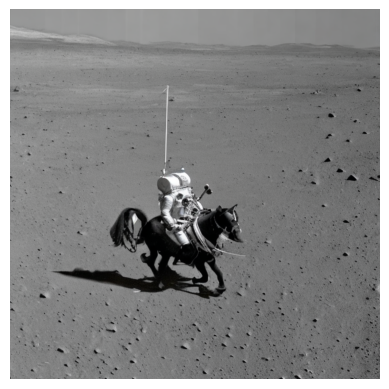

In [41]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Path to your image
image_path = '/content/astronaut_rides_horse.png'

# Load and display the image
img = mpimg.imread(image_path)
plt.imshow(img)
plt.axis('off')  # Turn off axis numbers and ticks
plt.show()


In [42]:
prompt = "papercut, a cute fox"
image = pipe(prompt).images[0]

image.save("fox.png")

  0%|          | 0/50 [00:00<?, ?it/s]

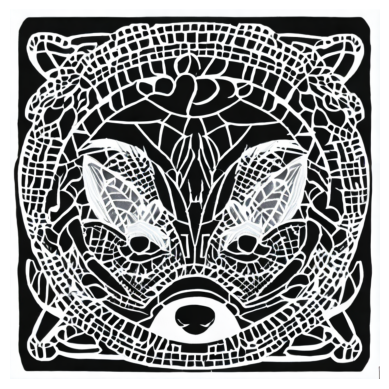

In [43]:
display_image('/content/fox.png')


In [44]:
prompt = "papercut, a cute fox"
image = pipe(prompt).images[0]

image.save("fox.png")

  0%|          | 0/50 [00:00<?, ?it/s]

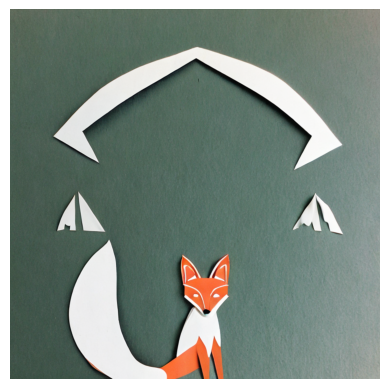

In [45]:
display_image('/content/fox.png')


In [46]:
prompt = "Create an image depicting a futuristic cityscape where nature seamlessly integrates with technology. Picture towering skyscrapers adorned with cascading gardens and vertical farms. Imagine hovercrafts whizzing past vibrant, illuminated walkways while robotic assistants tend to lush greenery. The city should exude a harmonious blend of advanced technology and flourishing green spaces, illustrating a vision of sustainable urban living."
image = pipe(prompt).images[0]

image.save("long_prompt.png")

Token indices sequence length is longer than the specified maximum sequence length for this model (79 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['living.']


  0%|          | 0/50 [00:00<?, ?it/s]

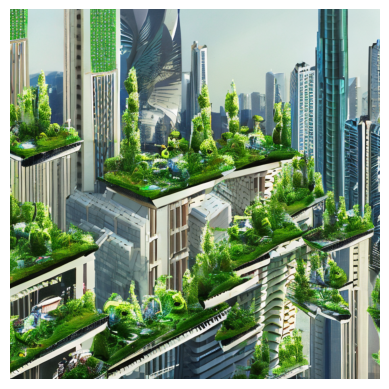

In [47]:
display_image('/content/long_prompt.png')


In [48]:
prompt = "Create an image depicting a futuristic cityscape where nature seamlessly integrates with technology. Picture towering skyscrapers adorned with cascading gardens and vertical farms. Imagine hovercrafts whizzing past vibrant, illuminated walkways while robotic assistants tend to lush greenery. The city should exude a harmonious blend of advanced technology and flourishing green spaces, illustrating a vision of sustainable urban living."
image = pipe(prompt).images[0]

image.save("long_prompt.png")

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['living.']


  0%|          | 0/50 [00:00<?, ?it/s]

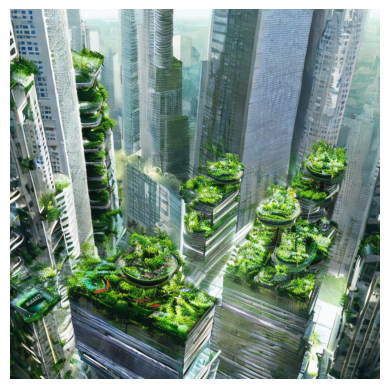

In [49]:
display_image('/content/long_prompt.png')


In [50]:
prompt = "Imagine a mystical forest illuminated by the soft glow of bioluminescent plants and creatures. Envision a serene clearing surrounded by ancient, towering trees adorned with glowing patterns. In the center of this clearing, visualize a majestic waterfall cascading into a crystal-clear pool, reflecting the shimmering starlit sky above. A sense of tranquility and magic permeates the scene, inviting viewers into a realm where nature's beauty and enchantment intertwine."
image = pipe(prompt).images[0]

image.save("forest.png")

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["inviting viewers into a realm where nature's beauty and enchantment intertwine."]


  0%|          | 0/50 [00:00<?, ?it/s]

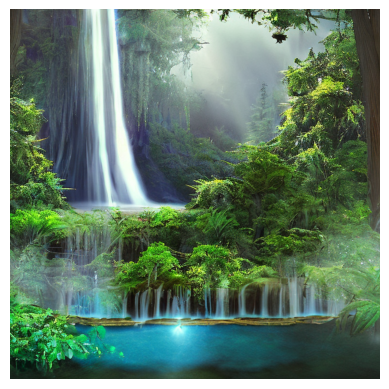

In [51]:
display_image('/content/forest.png')


In [59]:
prompt = "Imagine a mystical forest illuminated by the soft glow of bioluminescent plants and creatures. Envision a serene clearing surrounded by ancient, towering trees adorned with glowing patterns. In the center of this clearing, visualize a majestic waterfall cascading into a crystal-clear pool, reflecting the shimmering starlit sky above. A sense of tranquility and magic permeates the scene, inviting viewers into a realm where nature's beauty and enchantment intertwine,8k"
image = pipe(prompt).images[0]

image.save("forest.png")

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["inviting viewers into a realm where nature's beauty and enchantment intertwine, 8 k"]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["inviting viewers into a realm where nature's beauty and enchantment intertwine, 8 k"]


  0%|          | 0/50 [00:00<?, ?it/s]

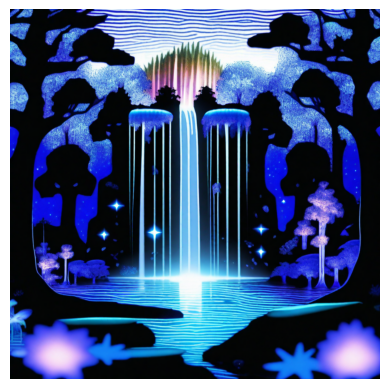

In [60]:
display_image('/content/forest.png')

#latent-consistency/lcm-lora-sdxl

In [54]:
import torch
from diffusers import LCMScheduler, AutoPipelineForText2Image

model_id = "stabilityai/stable-diffusion-xl-base-1.0"
adapter_id = "latent-consistency/lcm-lora-sdxl"

pipe = AutoPipelineForText2Image.from_pretrained(model_id, torch_dtype=torch.float16, variant="fp16")
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
pipe.to("cuda")

# load and fuse lcm lora
pipe.load_lora_weights(adapter_id)
pipe.fuse_lora()



model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


pytorch_lora_weights.safetensors:   0%|          | 0.00/394M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/diffusers/loaders.py:2314: FutureWarning: `fuse_text_encoder_lora` is deprecated and will be removed in version 0.25. You are using an old version of LoRA backend. This will be deprecated in the next releases in favor of PEFT make sure to install the latest PEFT and transformers packages in the future.
  deprecate("fuse_text_encoder_lora", "0.25", LORA_DEPRECATION_MESSAGE)


In [55]:
prompt = "Self-portrait oil painting, a beautiful cyborg with golden hair, 8k"

# disable guidance_scale by passing 0
image = pipe(prompt=prompt, num_inference_steps=4, guidance_scale=0).images[0]


  0%|          | 0/4 [00:00<?, ?it/s]

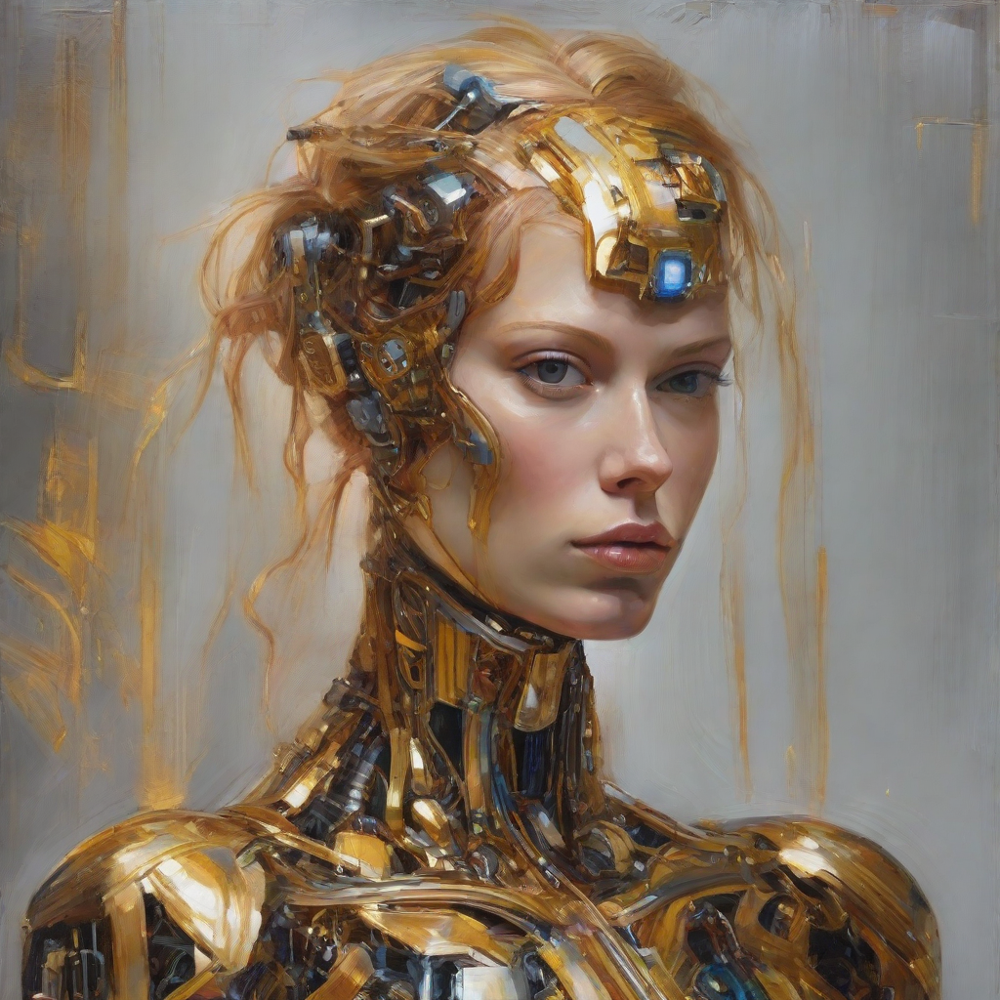

In [56]:
image

In [57]:
prompt = "Imagine a mystical forest illuminated by the soft glow of bioluminescent plants and creatures. Envision a serene clearing surrounded by ancient, towering trees adorned with glowing patterns. In the center of this clearing, visualize a majestic waterfall cascading into a crystal-clear pool, reflecting the shimmering starlit sky above. A sense of tranquility and magic permeates the scene, inviting viewers into a realm where nature's beauty and enchantment intertwine."

# disable guidance_scale by passing 0
image = pipe(prompt=prompt, num_inference_steps=4, guidance_scale=0).images[0]


Token indices sequence length is longer than the specified maximum sequence length for this model (93 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["inviting viewers into a realm where nature's beauty and enchantment intertwine."]
Token indices sequence length is longer than the specified maximum sequence length for this model (93 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["inviting viewers into a realm where nature's beauty and enchantment intertwine."]


  0%|          | 0/4 [00:00<?, ?it/s]

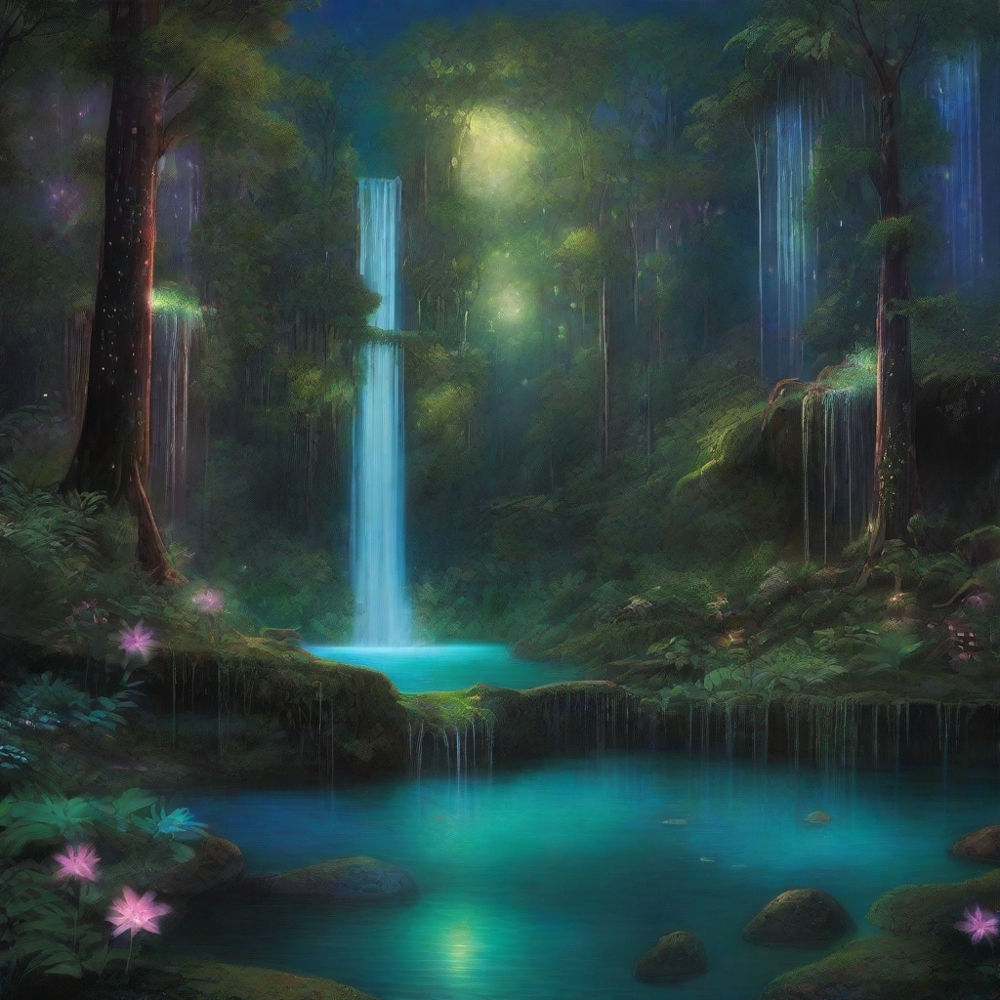

In [58]:
image

In [63]:
prompt = "Create an image depicting a futuristic cityscape where nature seamlessly integrates with technology. Picture towering skyscrapers adorned with cascading gardens and vertical farms. Imagine hovercrafts whizzing past vibrant, illuminated walkways while robotic assistants tend to lush greenery. The city should exude a harmonious blend of advanced technology and flourishing green spaces, illustrating a vision of sustainable urban living,8k"

# disable guidance_scale by passing 0
image = pipe(prompt=prompt, num_inference_steps=4, guidance_scale=0).images[0]


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['living, 8 k']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['living, 8 k']


  0%|          | 0/4 [00:00<?, ?it/s]

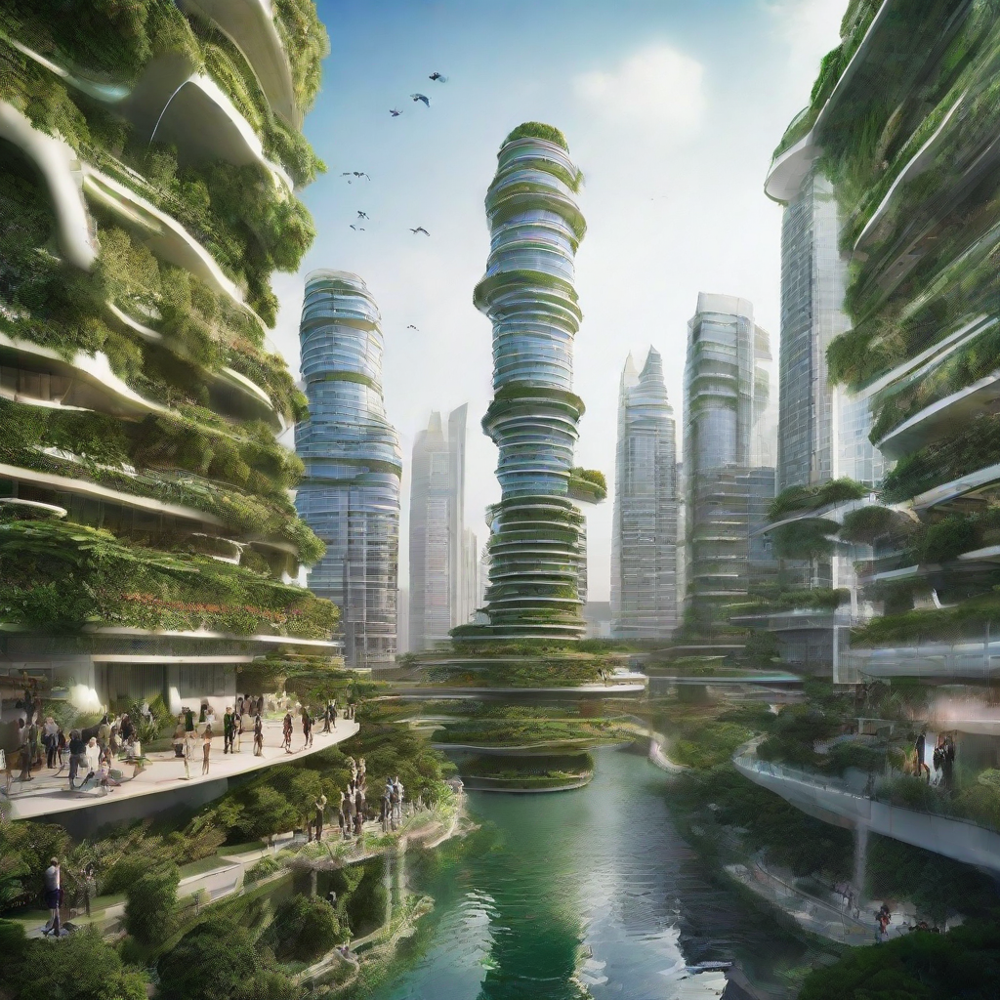

In [64]:
image

In [88]:
prompt="papercut, a cute fox,8k"

  0%|          | 0/4 [00:00<?, ?it/s]

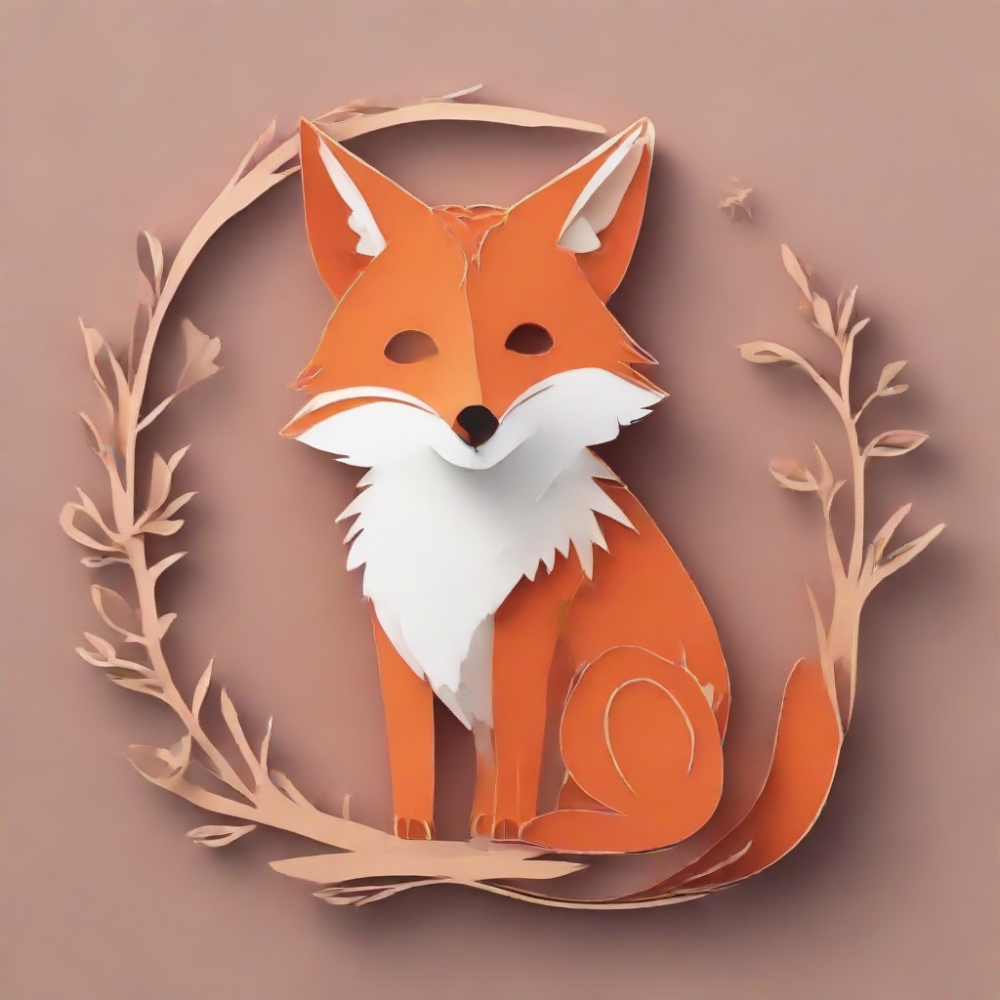

In [89]:
# disable guidance_scale by passing 0
image = pipe(prompt=prompt, num_inference_steps=4, guidance_scale=0).images[0]
image

In [90]:
prompt="papercut, a cute fox,8k"

  0%|          | 0/4 [00:00<?, ?it/s]

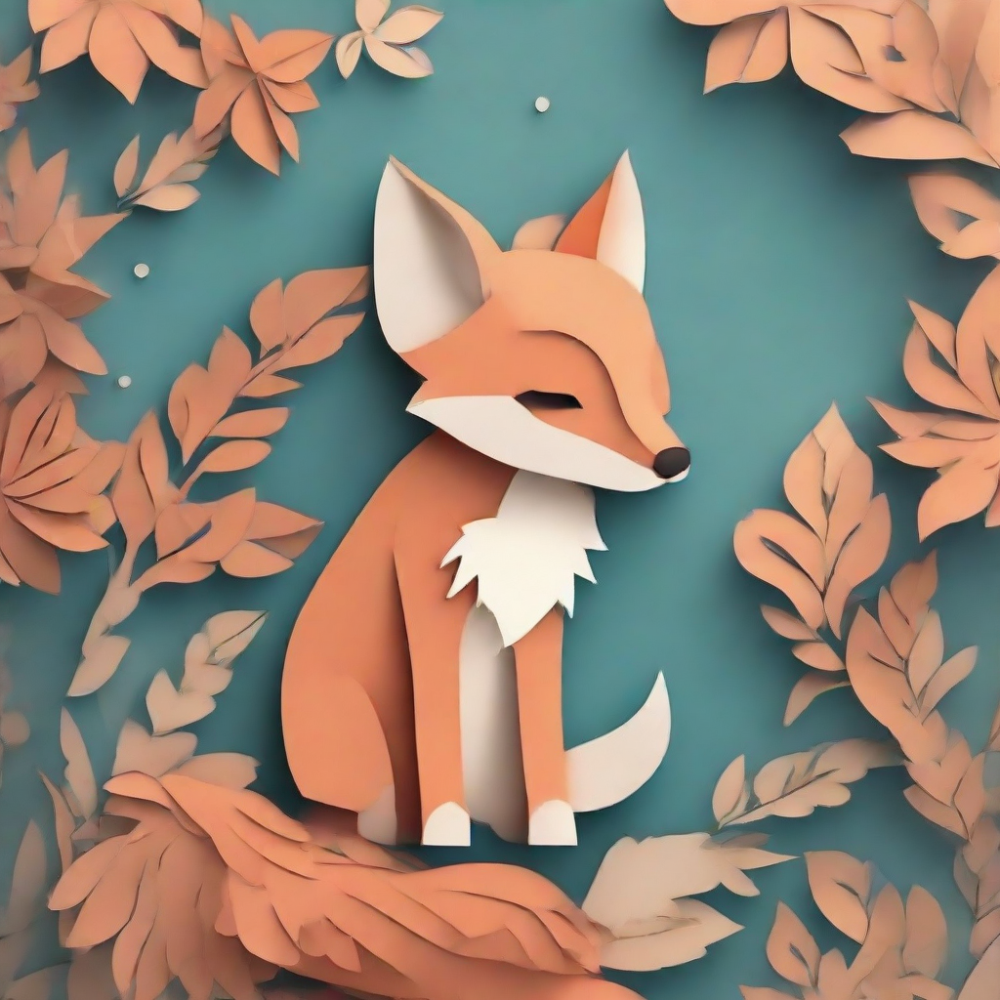

In [91]:
# disable guidance_scale by passing 0
image = pipe(prompt=prompt, num_inference_steps=4, guidance_scale=0).images[0]
image